# Data import and verification


In [1]:
import os
import pandas as pd
import numpy as np
# Set your working directory
# os.chdir('/Euro Dollar')
# Display all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

def reformat_date(df):
    for idx, date in enumerate(df['Date']):
        # check if the date does not contain a "/"
        if "/" not in str(date):            # reformat the date to "mm/dd/yyyy"
            if len(str(date))==3:
                date = '000'+str(date)

            # convert the string to a datetime object
            date_obj = pd.to_datetime(date, format='%y%m%d')
# .strftime('%m/%d/%Y')
        else:
            date_obj = pd.to_datetime(date, format='%m/%d/%Y')
            # reformat the date to "mm/dd/yyyy"
        df.loc[idx, 'Date'] = date_obj.strftime('%m/%d/%Y')
        
    return df

filenames = ['CL83M', 'CL83N', 'CL83Q', 
             'CL83U', 'CL83V', 'CL83X', 
             'CL83Z', 'CL84F', 'CL84G', 
             'CL84H', 'CL84J', 'CL84K', 
             'CL84M', 'CL84N', 'CL84Q', 
             'CL84U', 'CL84V', 'CL84X', 
             'CL84Z', 'CL85F', 'CL85G', 
             'CL85H', 'CL85J', 'CL85K', 
             'CL85M', 'CL85N', 'CL85Q', 
             'CL85U', 'CL85V', 'CL85X', 
             'CL85Z', 'CL86F', 'CL86G', 
             'CL86H', 'CL86J', 'CL86K', 
             'CL86M', 'CL86N', 'CL86Q', 
             'CL86U', 'CL86V', 'CL86X', 
             'CL86Z', 'CL87F', 'CL87G', 
             'CL87H', 'CL87J', 'CL87K',
             'CL87M', 'CL87N', 'CL87Q',
             'CL87U', 'CL87V', 'CL87X',
             'CL87Z', 'CL88F', 'CL88G',
             'CL88H', 'CL88J', 'CL88K',
             'CL88M', 'CL88N', 'CL88Q',
             'CL88U', 'CL88V', 'CL88X',
             'CL88Z', 'CL89F', 'CL89G',
             'CL89H', 'CL89J', 'CL89K',
             'CL89M', 'CL89N', 'CL89Q',
             'CL89U', 'CL89V', 'CL89X',
             'CL89Z', 'CL90F', 'CL90G',
             'CL90H', 'CL90J', 'CL90K',
             'CL90M', 'CL90N', 'CL90Q',
             'CL90U', 'CL90V', 'CL90X',
             'CL90Z', 'CL91F', 'CL91G',
             'CL91H', 'CL91J', 'CL91K',
             'CL91M', 'CL91N', 'CL91Q',
             'CL91U', 'CL91V', 'CL91X',
             'CL91Z', 'CL92F', 'CL92G',
             'CL92H', 'CL92J', 'CL92K',
             'CL92M', 'CL92N', 'CL92Q',
             'CL92U', 'CL92V', 'CL92X',
             'CL92Z', 'CL93F', 'CL93G',
             'CL93H', 'CL93J', 'CL93K',
             'CL93M', 'CL93N', 'CL93Q',
             'CL93U', 'CL93V', 'CL93X',
             'CL93Z', 'CL94F', 'CL94G',
             'CL94H', 'CL94J', 'CL94K',
             'CL94M', 'CL94N', 'CL94Q',
             'CL94U', 'CL94V', 'CL94X',
             'CL94Z', 'CL95F', 'CL95G',
             'CL95H', 'CL95J', 'CL95K',
             'CL95M', 'CL95N', 'CL95Q',
             'CL95U', 'CL95V', 'CL95X',
             'CL95Z', 'CL96F', 'CL96G',
             'CL96H', 'CL96J', 'CL96K',
             'CL96M', 'CL96N', 'CL96Q',
             'CL96U', 'CL96V', 'CL96X',
             'CL96Z', 'CL97F', 'CL97G',
             'CL97H', 'CL97J', 'CL97K',
             'CL97M', 'CL97N', 'CL97Q',
             'CL97U', 'CL97V', 'CL97X',
             'CL97Z', 'CL98F', 'CL98G',
             'CL98H', 'CL98J', 'CL98K',
             'CL98M', 'CL98N', 'CL98Q',
             'CL98U', 'CL98V', 'CL98X',
             'CL98Z', 'CL99F', 'CL99G',
             'CL99H', 'CL99J', 'CL99K',
             'CL99M', 'CL99N', 'CL99Q',
             'CL99U', 'CL99V', 'CL99X',
             'CL99Z','CL00F', 'CL00G', 'CL00H', 
             'CL00J', 'CL00K', 'CL00M', 
             'CL00N', 'CL00Q', 'CL00U', 
             'CL00V', 'CL00X', 'CL00Z', 
             'CL01F', 'CL01G', 'CL01H', 
             'CL01J', 'CL01K', 'CL01M', 
             'CL01N', 'CL01Q', 'CL01U', 
             'CL01V', 'CL01X', 'CL01Z', 
             'CL02F', 'CL02G', 'CL02H', 
             'CL02J', 'CL02K', 'CL02M', 
             'CL02N', 'CL02Q', 'CL02U', 
             'CL02V', 'CL02X', 'CL02Z', ]

# Create a dictionary to store your data
data = {}

previousKey = ''
# Go through each file in the directory
for file in filenames:
    # print(file)
    # Check if the file is a text file
    if 1:
        
        # Load the text file into a DataFrame
        df = pd.read_csv('Crude Oil/'+file+'.txt', sep=",", names =["Date","Open","High","Low","Close","Volume","OpenInt"])
        df = df[df['Date']!='Date']
        # print(df)
        df = reformat_date(df)
        df['Volume'] = pd.to_numeric(df['Volume'])
        df['OpenInt'] = pd.to_numeric(df['OpenInt'])
        df['Close'] = pd.to_numeric(df['Close'])
        df['NotionalValue'] = df['OpenInt']*df['Close']*1000
        key = file
        
        # Store the DataFrame in the dictionary
        data[key] = df
        previousKey=key


In [ ]:
data

In [5]:
def next_futures_contract(contract):
    # Dictionary mapping month codes to numbers for easy incrementing
    month_codes = {
        'F': 1,
        'G': 2,
        'H': 3,
        'J': 4,
        'K': 5,
        'M': 6,
        'N': 7,
        'Q': 8,
        'U': 9,
        'V': 10,
        'X': 11,
        'Z': 12
    }
    
    # Reverse dictionary mapping numbers back to month codes
    reverse_month_codes = {v: k for k, v in month_codes.items()}
    
    # Split the contract into root, month, and year
    root = contract[:-3]
    # print(root)
    month = contract[-1]
    # print(month)
    year = int(contract[2:-1])
    # print(year)
    # Increment the month and possibly the year
    if month_codes[month] == 12:
        month = 'F'
        year += 1
        if year > 99:
            year = 0
    else:
        month = reverse_month_codes[month_codes[month] + 1]
        
    # Construct the new contract
    new_contract = root  + str(year).zfill(2)+month

    return new_contract


In [6]:
for contract, df in data.items():
    # print(contract)
    prevContract = next_futures_contract(contract)
    if prevContract in list(data.keys()):
        prevDF = data[prevContract][['Date', 'Volume', 'OpenInt','NotionalValue']]
        merged_df = pd.merge(df, prevDF[['Date', 'OpenInt', 'Volume','NotionalValue']], on='Date', how='inner')

#             # rename the new column
        merged_df.rename(columns={'OpenInt_y': 'FollowingMonthOpenInt', 'OpenInt_x': 'OpenInt','Volume_y': 'FollowingMonthVolume', 'Volume_x': 'Volume','NotionalValue_y': 'FollowingNotionalValue', 'NotionalValue_x': 'NotionalValue'}, inplace=True)
        df = merged_df
        data[contract] = df
        

In [34]:
contracts = list(data.keys())
print(len(contracts))
df =data[contracts[234]]
df = df.set_index('Date')
# df = df.dropna()

# SizeOfContarct =1000 #barrels
# # Assuming df is your DataFrame and 'Date' is your date column
# df['Date'] = pd.to_datetime(df['Date']) # Convert the Date column to datetime type if not already
# df = df.set_index('Date') # Set the Date column as the index
# # df['Volume'] = pd.to_numeric(df['Volume'])
# # df['OpenInt'] = pd.to_numeric(df['OpenInt'])
# df.query('Date!=""')

235


int64


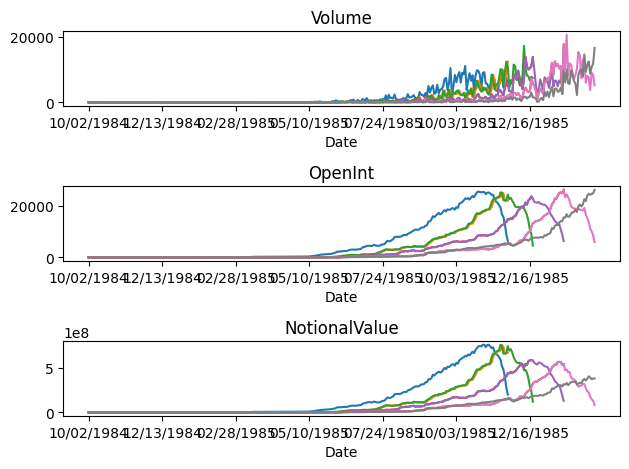

In [49]:
contracts = list(data.keys())
print(df['Volume'].dtypes)
import matplotlib.pyplot as plt


# Create two subplots
fig, axs = plt.subplots(3)
count =0 
for key, df in data.items():
    # Plot 'colA'
    if 65<count <70:
        # df = df[('/' in df['Date'])]
        df = df.set_index('Date')
    
        df['Volume'].plot(ax=axs[0])
        df['FollowingMonthVolume'].plot(ax=axs[0])
        axs[0].set_title('Volume')
    
# Plot 'colB'
        df['OpenInt'].plot(ax=axs[1])
        df['FollowingMonthOpenInt'].plot(ax=axs[1])
        axs[1].set_title('OpenInt')

# Plot 'colB'
        df['NotionalValue'].plot(ax=axs[2])
        df['FollowingNotionalValue'].plot(ax=axs[2])
        axs[2].set_title('NotionalValue')
    count+=1

# Plot 'colB'
# df['FollowingNotionalValue'].plot(ax=axs[2])



# # Plot 'colA'
# df['Volume'].plot(ax=axs[0])
# df['FollowingMonthVolume'].plot(ax=axs[0])
# axs[0].set_title('Volume')

# # Plot 'colB'
# df['OpenInt'].plot(ax=axs[1])
# df['FollowingMonthOpenInt'].plot(ax=axs[1])
# axs[1].set_title('OpenInt')

# # Plot 'colB'
# df['NotionalValue'].plot(ax=axs[2])
# axs[2].set_title('NotionalValue')

# # Plot 'colB'
# df['FollowingNotionalValue'].plot(ax=axs[2])
# axs[2].set_title('FollowingNotionalValue')


# Show the plots
plt.tight_layout() # Adjust the layout
plt.show()

# Handle missing values

In [43]:
for contract, df in data.items():
    if df.isna().any().any():
        print(f"Missing values in {contract}")

Missing values in CL00F
Missing values in CL00G
Missing values in CL00H
Missing values in CL00J
Missing values in CL00K
Missing values in CL00M
Missing values in CL00N
Missing values in CL00Q
Missing values in CL00U
Missing values in CL00V
Missing values in CL00X
Missing values in CL00Z
Missing values in CL01F
Missing values in CL01G
Missing values in CL01H
Missing values in CL01J
Missing values in CL01K
Missing values in CL01M
Missing values in CL01N
Missing values in CL01Q
Missing values in CL01U
Missing values in CL01V
Missing values in CL01X
Missing values in CL01Z
Missing values in CL02F
Missing values in CL02G
Missing values in CL02H
Missing values in CL02J
Missing values in CL02K
Missing values in CL02M
Missing values in CL02N
Missing values in CL02Q
Missing values in CL02U
Missing values in CL02V
Missing values in CL02X
Missing values in CL02Z
Missing values in CL83M
Missing values in CL83N
Missing values in CL83Q
Missing values in CL83U
Missing values in CL83V
Missing values i

# Date feature engineering

In [15]:
for contract, df in data.items():
    df['Date'] = pd.to_datetime(df['Date'], dayfirst=False)

In [16]:
for contract, df in data.items():
    df['Year'] = df['Date'].dt.year
    df['Quarter'] = df['Date'].dt.quarter
    df['Month'] = df['Date'].dt.month
    df['Week'] = df['Date'].dt.isocalendar().week
    df['Day'] = df['Date'].dt.day
    df['DayOfWeek'] = df['Date'].dt.dayofweek


In [4]:
data

{'CL00F':            Date   Open   High    Low  Close  Volume  OpenInt  NotionalValue
 0    08/21/1997  19.55  19.55  19.55  19.55      10       10   1.955000e+05
 1    08/22/1997  19.65  19.65  19.65  19.65       0       10   1.965000e+05
 2    08/25/1997  19.44  19.44  19.44  19.44       0       10   1.944000e+05
 3    08/26/1997  19.48  19.48  19.48  19.48       0       10   1.948000e+05
 4    08/27/1997  19.78  19.78  19.78  19.78       0       10   1.978000e+05
 5    08/28/1997  19.63  19.63  19.63  19.63       0       10   1.963000e+05
 6    08/29/1997  19.72  19.72  19.72  19.72       0       10   1.972000e+05
 7    09/02/1997  19.68  19.68  19.68  19.68       0       10   1.968000e+05
 8    09/03/1997  19.64  19.64  19.64  19.64       0       10   1.964000e+05
 9    09/04/1997  19.50  19.50  19.50  19.50       0       10   1.950000e+05
 10   09/05/1997  19.64  19.64  19.64  19.64       0       10   1.964000e+05
 11   09/08/1997  19.57  19.57  19.57  19.57       0       10   1.9

In [17]:
for contract, df in data.items():
    df['Month_sin'] = np.sin(2 * np.pi * df['Month']/12)
    df['Month_cos'] = np.cos(2 * np.pi * df['Month']/12)
    df['DayOfWeek_sin'] = np.sin(2 * np.pi * df['DayOfWeek']/7)
    df['DayOfWeek_cos'] = np.cos(2 * np.pi * df['DayOfWeek']/7)
    # And so on for other cyclical features


In [18]:
first_contract = list(data.keys())[7]
print(data[first_contract].head())


        Date    Open    High     Low  Close  Volume  OpenInt  NotionalValue  \
0 2000-01-04  22.070  22.070  21.560  21.56   915.0  16036.0    345736160.0   
1 2000-01-05  21.300  21.900  21.250  21.79   796.0  15898.0    346417420.0   
2 2000-01-06  21.600  21.700  21.460  21.46  1208.0  16136.0    346278560.0   
3 2000-01-07  21.480  21.860  21.390  21.39   833.0  16462.0    352122180.0   
4 2000-01-10  21.440  21.700  21.380  21.38  1255.0  16676.0    356532880.0   

   FollowingMonthOpenInt  FollowingMonthVolume  FollowingNotionalValue  Year  \
0                    NaN                   NaN                     NaN  2000   
1                13332.0                 427.0             285571440.0  2000   
2                13286.0                 865.0             280334600.0  2000   
3                14665.0                1857.0             308404950.0  2000   
4                14615.0                1129.0             307645750.0  2000   

   Quarter  Month  Week  Day  DayOfWeek  Mon

# Lag Features

In [51]:
newDataFrame = []

for key,value in (data.items()):
    newDataFrame.append(value)

newDataFrame = pd.concat(newDataFrame)
newDataFrame.head(10)

,Date,Open,High,Low,Close,Volume,OpenInt,NotionalValue,FollowingMonthOpenInt,FollowingMonthVolume,FollowingNotionalValue,Year,Quarter,Month,Week,Day,DayOfWeek,Month_sin,Month_cos,DayOfWeek_sin,DayOfWeek_cos,Rolling_Volume,Days_Until_Rollover,Volume_Change,OpenInt_Change,Rollover_Point
4,1997-09-15,19.42,19.42,19.42,19.42,0.0,10.0,194200.0,0.0,0.0,0.0,1997,3,9,38,15,0,-1.0,-1.836970e-16,0.000000,1.000000,0.0,826.0,NaN,NaN,False
5,1997-09-16,19.64,19.64,19.64,19.64,0.0,10.0,196400.0,0.0,0.0,0.0,1997,3,9,38,16,1,-1.0,-1.836970e-16,0.781831,0.623490,0.0,825.0,0.0,0.0,False
6,1997-09-17,19.52,19.52,19.52,19.52,0.0,10.0,195200.0,0.0,0.0,0.0,1997,3,9,38,17,2,-1.0,-1.836970e-16,0.974928,-0.222521,0.0,824.0,0.0,0.0,False
7,1997-09-18,19.52,19.52,19.52,19.52,0.0,10.0,195200.0,0.0,0.0,0.0,1997,3,9,38,18,3,-1.0,-1.836970e-16,0.433884,-0.900969,0.0,823.0,0.0,0.0,False
8,1997-09-19,19.55,19.55,19.55,19.55,0.0,10.0,195500.0,0.0,0.0,0.0,1997,3,9,38,19,4,-1.0,-1.836970e-16,-0.433884,-0.900969,0.0,822.0,0.0,0.0,False
9,1997-09-22,19.72,19.72,19.72,19.72,0.0,10.0,197200.0,0.0,0.0,0.0,1997,3,9,39,22,0,-1.0,-1.836970e-16,0.000000,1.000000,0.0,819.0,0.0,0.0,False
10,1997-09-23,19.74,19.74,19.74,19.74,0.0,10.0,197400.0,0.0,0.0,0.0,1997,3,9,39,23,1,-1.0,-1.836970e-16,0.781831,0.623490,0.0,818.0,0.0,0.0,False
11,1997-09-24,19.88,19.88,19.88,19.88,0.0,10.0,198800.0,0.0,0.0,0.0,1997,3,9,39,24,2,-1.0,-1.836970e-16,0.974928,-0.222521,0.0,817.0,0.0,0.0,False
12,1997-09-25,20.08,20.08,20.08,20.08,0.0,10.0,200800.0,0.0,0.0,0.0,1997,3,9,39,25,3,-1.0,-1.836970e-16,0.433884,-0.900969,0.0,816.0,0.0,0.0,False
13,1997-09-26,20.18,20.18,20.18,20.18,0.0,10.0,201800.0,0.0,0.0,0.0,1997,3,9,39,26,4,-1.0,-1.836970e-16,-0.433884,-0.900969,0.0,815.0,0.0,0.0,False


In [55]:
data[contracts[2]]

,Date,Open,High,Low,Close,Volume,OpenInt,NotionalValue,FollowingMonthOpenInt,FollowingMonthVolume,FollowingNotionalValue,Year,Quarter,Month,Week,Day,DayOfWeek,Month_sin,Month_cos,DayOfWeek_sin,DayOfWeek_cos,Rolling_Volume,Days_Until_Rollover,Volume_Change,OpenInt_Change,Rollover_Point
4,1998-01-08,18.38,18.38,18.38,18.38,0,243,4.466340e+06,110.0,0.0,2.025100e+06,1998,1,1,2,8,3,5.000000e-01,8.660254e-01,0.433884,-0.900969,10.0,771,NaN,NaN,False
5,1998-01-09,18.37,18.37,18.37,18.37,0,243,4.463910e+06,110.0,0.0,2.022900e+06,1998,1,1,2,9,4,5.000000e-01,8.660254e-01,-0.433884,-0.900969,10.0,770,0.0,0.0,False
6,1998-01-12,18.34,18.34,18.34,18.34,0,243,4.456620e+06,110.0,0.0,2.021800e+06,1998,1,1,3,12,0,5.000000e-01,8.660254e-01,0.000000,1.000000,10.0,767,0.0,0.0,False
7,1998-01-13,18.46,18.46,18.46,18.46,0,243,4.485780e+06,110.0,0.0,2.018500e+06,1998,1,1,3,13,1,5.000000e-01,8.660254e-01,0.781831,0.623490,0.0,766,0.0,0.0,False
8,1998-01-14,18.45,18.45,18.45,18.45,0,243,4.483350e+06,110.0,0.0,2.031700e+06,1998,1,1,3,14,2,5.000000e-01,8.660254e-01,0.974928,-0.222521,0.0,765,0.0,0.0,False
9,1998-01-15,18.40,18.40,18.40,18.40,0,243,4.471200e+06,110.0,0.0,2.030600e+06,1998,1,1,3,15,3,5.000000e-01,8.660254e-01,0.433884,-0.900969,0.0,764,0.0,0.0,False
10,1998-01-16,18.61,18.61,18.61,18.61,0,243,4.522230e+06,110.0,0.0,2.025100e+06,1998,1,1,3,16,4,5.000000e-01,8.660254e-01,-0.433884,-0.900969,0.0,763,0.0,0.0,False
11,1998-01-20,18.47,18.47,18.47,18.47,0,243,4.488210e+06,110.0,0.0,2.048200e+06,1998,1,1,4,20,1,5.000000e-01,8.660254e-01,0.781831,0.623490,0.0,759,0.0,0.0,False
12,1998-01-21,18.32,18.32,18.32,18.32,0,243,4.451760e+06,110.0,0.0,2.032800e+06,1998,1,1,4,21,2,5.000000e-01,8.660254e-01,0.974928,-0.222521,0.0,758,0.0,0.0,False
13,1998-01-22,18.32,18.32,18.32,18.32,0,243,4.451760e+06,110.0,0.0,2.016300e+06,1998,1,1,4,22,3,5.000000e-01,8.660254e-01,0.433884,-0.900969,0.0,757,0.0,0.0,False


In [53]:
newDataFrame.shape

(82138, 26)

# Split data into test and train sets

In [20]:
# Import the required library
from sklearn.model_selection import train_test_split

# Define a dictionary to hold your training and testing data
train_data = {}
test_data = {}

# Split each contract's data into a training and testing set
for contract, df in data.items():
    train, test = train_test_split(df, test_size=0.2, shuffle=False)
    train_data[contract] = train
    test_data[contract] = test


In [21]:
first_contract = list(train_data.keys())[0]
print(f"Training data for {first_contract}: {train_data[first_contract].shape}")
print(f"Testing data for {first_contract}: {test_data[first_contract].shape}")


Training data for CL00F: (458, 22)
Testing data for CL00F: (115, 22)


In [22]:
from sklearn.preprocessing import MinMaxScaler

# Define the columns to be scaled
cols_to_scale = ['Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']

# Initialize a scaler with a feature range from 0 to 1
scaler = MinMaxScaler(feature_range=(0, 1))

# for contract, df in data.items():
#     df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])
# Assume train and test are your training and testing data
scaler = MinMaxScaler(feature_range=(0, 1))

train[cols_to_scale] = scaler.fit_transform(train[cols_to_scale])
test[cols_to_scale] = scaler.transform(test[cols_to_scale])
# Define the number of lags
n_lags = 3

# Define the columns for which you want to create lag features
cols_to_lag = ['Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']

for contract, df in data.items():
    for col in cols_to_lag:
        for lag in range(1, n_lags + 1):
            train[f'{col}_lag{lag}'] = train[col].shift(lag)
            test[f'{col}_lag{lag}'] = test[col].shift(lag)
test.dropna(inplace=True)
train.dropna(inplace=True)

for contract, df in data.items():
    df.dropna(inplace=True)


first_contract = list(data.keys())[4]
print(data[first_contract].head())


        Date   Open   High    Low  Close  Volume  OpenInt  NotionalValue  \
4 1998-01-08  18.40  18.40  18.40  18.40       0      113      2079200.0   
5 1998-01-09  18.39  18.39  18.39  18.39       0      113      2078070.0   
6 1998-01-12  18.36  18.36  18.36  18.36       0      113      2074680.0   
7 1998-01-13  18.48  18.48  18.48  18.48       0      113      2088240.0   
8 1998-01-14  18.47  18.47  18.47  18.47       0      113      2087110.0   

   FollowingMonthOpenInt  FollowingMonthVolume  FollowingNotionalValue  Year  \
4                   5235                    50              96376350.0  1998   
5                   5235                    50              96324000.0  1998   
6                   5232                     0              96111840.0  1998   
7                   5232                     0              96739680.0  1998   
8                   5232                     0              96687360.0  1998   

   Quarter  Month  Week  Day  DayOfWeek  Month_sin  Month_cos 

In [23]:
first_contract = list(data.keys())[0]
print(data[first_contract].head())

        Date   Open   High    Low  Close  Volume  OpenInt  NotionalValue  \
4 1997-09-15  19.42  19.42  19.42  19.42       0       10       194200.0   
5 1997-09-16  19.64  19.64  19.64  19.64       0       10       196400.0   
6 1997-09-17  19.52  19.52  19.52  19.52       0       10       195200.0   
7 1997-09-18  19.52  19.52  19.52  19.52       0       10       195200.0   
8 1997-09-19  19.55  19.55  19.55  19.55       0       10       195500.0   

   FollowingMonthOpenInt  FollowingMonthVolume  FollowingNotionalValue  Year  \
4                      0                     0                     0.0  1997   
5                      0                     0                     0.0  1997   
6                      0                     0                     0.0  1997   
7                      0                     0                     0.0  1997   
8                      0                     0                     0.0  1997   

   Quarter  Month  Week  Day  DayOfWeek  Month_sin     Month_c

In [24]:
train

,Date,Open,High,Low,Close,Volume,OpenInt,NotionalValue,FollowingMonthOpenInt,FollowingMonthVolume,FollowingNotionalValue,Year,Quarter,Month,Week,Day,DayOfWeek,Month_sin,Month_cos,DayOfWeek_sin,DayOfWeek_cos,Rolling_Volume,Open_lag1,Open_lag2,Open_lag3,High_lag1,High_lag2,High_lag3,Low_lag1,Low_lag2,Low_lag3,Close_lag1,Close_lag2,Close_lag3,Volume_lag1,Volume_lag2,Volume_lag3,OpenInt_lag1,OpenInt_lag2,OpenInt_lag3
4,1997-09-15,0.898039,0.877984,0.900393,0.881443,0.000932,0.207646,2.932420e+08,10,0,194200.0,1997,3,9,38,15,0,-1.000000e+00,-1.836970e-16,0.000000,1.000000,267.8,0.900654,0.904575,0.915033,0.880637,0.884615,0.895225,0.903014,0.906946,0.917431,0.884021,0.887887,0.898196,0.011759,0.012640,0.015023,0.208650,0.210561,0.210781
5,1997-09-16,0.905882,0.915119,0.895151,0.909794,0.010620,0.209172,2.987440e+08,10,0,196400.0,1997,3,9,38,16,1,-1.000000e+00,-1.836970e-16,0.781831,0.623490,196.8,0.898039,0.900654,0.904575,0.877984,0.880637,0.884615,0.900393,0.903014,0.906946,0.881443,0.884021,0.887887,0.000932,0.011759,0.012640,0.207646,0.208650,0.210561
6,1997-09-17,0.911111,0.891247,0.913499,0.894330,0.000000,0.207660,2.947715e+08,10,0,195200.0,1997,3,9,38,17,2,-1.000000e+00,-1.836970e-16,0.974928,-0.222521,138.8,0.905882,0.898039,0.900654,0.915119,0.877984,0.880637,0.895151,0.900393,0.903014,0.909794,0.881443,0.884021,0.010620,0.000932,0.011759,0.209172,0.207646,0.208650
7,1997-09-18,0.911111,0.891247,0.913499,0.894330,0.026212,0.200784,2.850115e+08,10,0,195200.0,1997,3,9,38,18,3,-1.000000e+00,-1.836970e-16,0.433884,-0.900969,191.2,0.911111,0.905882,0.898039,0.891247,0.915119,0.877984,0.913499,0.895151,0.900393,0.894330,0.909794,0.881443,0.000000,0.010620,0.000932,0.207660,0.209172,0.207646
8,1997-09-19,0.913725,0.893899,0.916121,0.896907,0.010361,0.199409,2.833495e+08,10,0,195500.0,1997,3,9,38,19,4,-1.000000e+00,-1.836970e-16,-0.433884,-0.900969,185.8,0.911111,0.911111,0.905882,0.891247,0.891247,0.915119,0.913499,0.913499,0.895151,0.894330,0.894330,0.909794,0.026212,0.000000,0.010620,0.200784,0.207660,0.209172
9,1997-09-22,0.937255,0.917772,0.939712,0.920103,0.011345,0.202420,2.902784e+08,10,0,197200.0,1997,3,9,39,22,0,-1.000000e+00,-1.836970e-16,0.000000,1.000000,226.0,0.913725,0.911111,0.911111,0.893899,0.891247,0.891247,0.916121,0.913499,0.913499,0.896907,0.894330,0.894330,0.010361,0.026212,0.000000,0.199409,0.200784,0.207660
10,1997-09-23,0.939869,0.920424,0.942333,0.922680,0.002590,0.202420,2.905728e+08,10,0,197400.0,1997,3,9,39,23,1,-1.000000e+00,-1.836970e-16,0.781831,0.623490,195.0,0.937255,0.913725,0.911111,0.917772,0.893899,0.891247,0.939712,0.916121,0.913499,0.920103,0.896907,0.894330,0.011345,0.010361,0.026212,0.202420,0.199409,0.200784
11,1997-09-24,0.958170,0.938992,0.960682,0.940722,0.036935,0.199670,2.886576e+08,10,0,198800.0,1997,3,9,39,24,2,-1.000000e+00,-1.836970e-16,0.974928,-0.222521,337.6,0.939869,0.937255,0.913725,0.920424,0.917772,0.893899,0.942333,0.939712,0.916121,0.922680,0.920103,0.896907,0.002590,0.011345,0.010361,0.202420,0.202420,0.199409
12,1997-09-25,0.984314,0.965517,0.986894,0.966495,0.023415,0.193138,2.820236e+08,10,0,200800.0,1997,3,9,39,25,3,-1.000000e+00,-1.836970e-16,0.433884,-0.900969,326.8,0.958170,0.939869,0.937255,0.938992,0.920424,0.917772,0.960682,0.942333,0.939712,0.940722,0.922680,0.920103,0.036935,0.002590,0.011345,0.199670,0.202420,0.202420
13,1997-09-26,0.997386,0.978780,1.000000,0.979381,0.025901,0.198144,2.907736e+08,10,0,201800.0,1997,3,9,39,26,4,-1.000000e+00,-1.836970e-16,-0.433884,-0.900969,386.8,0.984314,0.958170,0.939869,0.965517,0.938992,0.920424,0.986894,0.960682,0.942333,0.966495,0.940722,0.922680,0.023415,0.036935,0.002590,0.193138,0.199670,0.202420


In [25]:
def create_sequences(data, seq_length):
    xs = []
    ys = []
    dates = []
    
    for i in range(len(data) - seq_length - 1):
        x = data.iloc[i:(i + seq_length)].drop('Date', axis=1).values
        y = data.iloc[i + seq_length + 1]['Volume']
        date = data.iloc[i + seq_length + 1]['Date']
        xs.append(x)
        ys.append(y)
        dates.append(date)
    
    return np.array(xs), np.array(ys), np.array(dates)

seq_length = 10
train_sequences = {}
test_sequences = {}

for contract in train_data.keys():
    X_train, y_train, dates_train = create_sequences(train_data[contract], seq_length)
    X_test, y_test, dates_test = create_sequences(test_data[contract], seq_length)

    
    train_sequences[contract] = (X_train, y_train)
    test_sequences[contract] = (X_test, y_test)



In [26]:
first_contract = list(train_sequences.keys())[0]
print(f"Training sequences for {first_contract}: {train_sequences[first_contract][0].shape}")
print(f"Testing sequences for {first_contract}: {test_sequences[first_contract][0].shape}")


Training sequences for CL00F: (447, 10, 21)
Testing sequences for CL00F: (104, 10, 21)


In [27]:
X_train

array([[[0.8980392156862746, 0.8779840848806366, 0.9003931847968547,
         ..., 0.20864961496149614, 0.21056105610561054,
         0.21078107810781077],
        [0.9058823529411766, 0.9151193633952255, 0.8951507208387943,
         ..., 0.20764576457645764, 0.20864961496149614,
         0.21056105610561054],
        [0.9111111111111112, 0.8912466843501325, 0.9134993446920052,
         ..., 0.20917216721672166, 0.20764576457645764,
         0.20864961496149614],
        ...,
        [0.9581699346405228, 0.938992042440318, 0.9606815203145478, ...,
         0.20242024202420242, 0.20242024202420242, 0.1994086908690869],
        [0.9843137254901959, 0.9655172413793103, 0.9868938401048493,
         ..., 0.19966996699669967, 0.20242024202420242,
         0.20242024202420242],
        [0.9973856209150329, 0.9787798408488062, 1.0000000000000002,
         ..., 0.19313806380638063, 0.19966996699669967,
         0.20242024202420242]],

       [[0.9058823529411766, 0.9151193633952255, 0.895150720

In [28]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Define your model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_length, X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')


In [29]:
# Train the model
model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

predictions = model.predict(X_test)
result = pd.DataFrame({
    'Date': dates_test,
    'Prediction': predictions.flatten(),  # assuming predictions is 2D
    'Actual': y_test
})


# Define your roll over threshold
rollover_threshold = 0.8  # adjust this based on your data and task

# Check whether the predicted volume is below the threshold
rollover_prediction = predictions / X_test[:, -1, 4] < rollover_threshold

print(rollover_prediction)
true_predictions = result[result['Prediction'] < rollover_threshold]


Epoch 1/10
14/14 [==============================] - 5s 79ms/step - loss: 30325759054708736.0000 - val_loss: 1419222258781519872.0000
Epoch 2/10
14/14 [==============================] - 0s 16ms/step - loss: 16298938105593856.0000 - val_loss: 294093762424995840.0000
Epoch 3/10
14/14 [==============================] - 0s 15ms/step - loss: 5773201623744512.0000 - val_loss: 41420067602169856.0000
Epoch 4/10
14/14 [==============================] - 0s 16ms/step - loss: 4170619939717120.0000 - val_loss: 21974287489433600.0000
Epoch 5/10
14/14 [==============================] - 0s 15ms/step - loss: 4063585059733504.0000 - val_loss: 40833499623587840.0000
Epoch 6/10
14/14 [==============================] - 0s 16ms/step - loss: 1800372846854144.0000 - val_loss: 74027781435949056.0000
Epoch 7/10
14/14 [==============================] - 0s 16ms/step - loss: 2010270448746496.0000 - val_loss: 92440091485536256.0000
Epoch 8/10
14/14 [==============================] - 0s 16ms/step - loss: 166243769044

In [30]:
print(X_train.dtype)
print(y_train.dtype)
print(X_test.dtype)
print(y_test.dtype)


float64
float64
float64
float64


In [31]:
true_predictions


,Date,Prediction,Actual
3,1999-07-12,-20173916.0,0.288127
5,1999-07-14,-18089652.0,0.762381
15,1999-07-28,-99764928.0,0.483475
16,1999-07-29,-97938368.0,0.739847
27,1999-08-13,-134632800.0,0.682501
29,1999-08-17,-123743296.0,1.095524
30,1999-08-18,-124578824.0,0.955294
31,1999-08-19,-129177280.0,0.976274
35,1999-08-25,-172682672.0,1.472389
38,1999-08-30,-178693312.0,1.169291


In [32]:
# We first need to create a target variable for each contract that represents the number of days until the rollover.
for contract, df in data.items():
    if contract in rollover_dates['Contract'].values:
        rollover_date = rollover_dates[rollover_dates['Contract'] == contract]['Rollover_Date'].values[0]
        df['Days_Until_Rollover'] = (pd.to_datetime(rollover_date) - df['Date']).dt.days
    else:
        df['Days_Until_Rollover'] = np.nan

# After creating the target variable, we can create sequences for training and testing as before, but now predicting 'Days_Until_Rollover' instead of 'Volume'.
def create_sequences(data, seq_length):
    xs = []
    ys = []
    dates = []
    
    for i in range(len(data) - seq_length - 1):
        x = data.iloc[i:(i + seq_length)].drop(['Date', 'OpenInt'], axis=1).values
        y = data.iloc[i + seq_length + 1]['Days_Until_Rollover']
        date = data.iloc[i + seq_length + 1]['Date']
        xs.append(x)
        ys.append(y)
        dates.append(date)
    
    return np.array(xs), np.array(ys), np.array(dates)

# Now we can retrain our LSTM model to predict 'Days_Until_Rollover'.
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_length, X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(X_train, y_train, epochs=25, validation_data=(X_test, y_test))

# Now, predictions would represent the predicted number of days until the rollover.
predictions = model.predict(X_test)

Epoch 1/25
14/14 [==============================] - 5s 68ms/step - loss: 2086022263341056.0000 - val_loss: 985432073714008064.0000
Epoch 2/25
14/14 [==============================] - 0s 15ms/step - loss: 3648220920020992.0000 - val_loss: 155569367638081536.0000
Epoch 3/25
14/14 [==============================] - 0s 14ms/step - loss: 753037085769728.0000 - val_loss: 73989805335117824.0000
Epoch 4/25
14/14 [==============================] - 0s 15ms/step - loss: 486219792252928.0000 - val_loss: 47998376951676928.0000
Epoch 5/25
14/14 [==============================] - 0s 16ms/step - loss: 285742798471168.0000 - val_loss: 35752076571049984.0000
Epoch 6/25
14/14 [==============================] - 0s 14ms/step - loss: 199539466174464.0000 - val_loss: 27063789375455232.0000
Epoch 7/25
14/14 [==============================] - 0s 16ms/step - loss: 151704821563392.0000 - val_loss: 17897451918721024.0000
Epoch 8/25
14/14 [==============================] - 0s 14ms/step - loss: 130469697945600.0000

In [33]:
predictions

array([[-1.4353841e+06],
       [-7.9562240e+06],
       [ 1.9599877e+04],
       [ 7.4058388e+05],
       [-7.4743560e+06],
       [-7.9173640e+06],
       [ 5.4712388e+05],
       [-8.3522960e+06],
       [-8.2373680e+06],
       [-6.9166280e+06],
       [-7.4764000e+06],
       [-3.2313392e+07],
       [-3.2296468e+07],
       [-3.2017744e+07],
       [-7.7034480e+06],
       [-3.0601056e+07],
       [-3.0334824e+07],
       [-2.8588696e+07],
       [-3.7712480e+06],
       [-4.0512080e+06],
       [-4.4058480e+06],
       [-4.6295720e+06],
       [-3.4689120e+06],
       [-4.4084000e+06],
       [-4.3094120e+06],
       [-2.7724920e+06],
       [-3.1081160e+06],
       [-3.3663680e+06],
       [-3.8954800e+06],
       [-8.5926400e+06],
       [-5.3969760e+06],
       [-4.0305040e+06],
       [-3.5909160e+06],
       [-3.2044080e+06],
       [-2.8255520e+06],
       [-1.5731880e+07],
       [ 1.9442079e+06],
       [-3.3222536e+07],
       [-3.5535456e+07],
       [-8.3430412e+05],


In [34]:
# Print the number of days until rollover for each contract
for contract, df in data.items():
    print(f"Contract: {contract}")
    # print("Date: Days Until Rollover")
    print(df[['Date', 'Days_Until_Rollover']].tail(10))  # Change 10 to display more or fewer rows
    print("\n")


Contract: CL00F
          Date  Days_Until_Rollover
563 1999-12-07                 -329
564 1999-12-08                 -330
565 1999-12-09                 -331
566 1999-12-10                 -332
567 1999-12-13                 -335
568 1999-12-14                 -336
569 1999-12-15                 -337
570 1999-12-16                 -338
571 1999-12-17                 -339
572 1999-12-20                 -342


Contract: CL00G
          Date  Days_Until_Rollover
503 2000-01-06                   14
504 2000-01-07                   13
505 2000-01-10                   10
506 2000-01-11                    9
507 2000-01-12                    8
508 2000-01-13                    7
509 2000-01-14                    6
510 2000-01-18                    2
511 2000-01-19                    1
512 2000-01-20                    0


Contract: CL00H
          Date  Days_Until_Rollover
525 2000-02-08                   14
526 2000-02-09                   13
527 2000-02-10                   12
528 2000-02-

In [35]:
for contract, df in data.items():
    x = df

In [36]:
# Calculate the change in volume and open interest for each contract
for contract, df in data.items():
    df['Volume_Change'] = df['Volume'].diff()
    df['OpenInt_Change'] = df['OpenInt'].diff()


In [37]:
# Calculate the change in volume and open interest for each contract
for contract, df in data.items():
    df['Volume_Change'] = df['Volume'].diff()
    df['OpenInt_Change'] = df['OpenInt'].diff()

# Convert the dictionary keys to a list
keys = list(data.keys())

# Define the rollover point based on the changes in volume and open interest
for i in range(len(keys) - 1):
    current_contract = keys[i]
    next_contract = keys[i + 1]
    
    current_df = data[current_contract]
    next_df = data[next_contract]
    
    current_df['Rollover_Point'] = (current_df['Volume_Change'] < 0) & (current_df['OpenInt_Change'] < 0)
    next_df['Rollover_Point'] = (next_df['Volume_Change'] > 0) & (next_df['OpenInt_Change'] > 0)

# Adjust the 'Days_Until_Rollover' column based on the new rollover criteria
for contract, df in data.items():
    rollover_points = df[df['Rollover_Point']].index
    for point in rollover_points:
        df.loc[:point, 'Days_Until_Rollover'] = (df.loc[point, 'Date'] - df['Date']).dt.days



In [38]:
data.keys()

dict_keys(['CL00F', 'CL00G', 'CL00H', 'CL00J', 'CL00K', 'CL00M', 'CL00N', 'CL00Q', 'CL00U', 'CL00V', 'CL00X', 'CL00Z', 'CL01F', 'CL01G', 'CL01H', 'CL01J', 'CL01K', 'CL01M', 'CL01N', 'CL01Q', 'CL01U', 'CL01V', 'CL01X', 'CL01Z', 'CL02F', 'CL02G', 'CL02H', 'CL02J', 'CL02K', 'CL02M', 'CL02N', 'CL02Q', 'CL02U', 'CL02V', 'CL02X', 'CL02Z', 'CL83M', 'CL83N', 'CL83Q', 'CL83U', 'CL83V', 'CL83X', 'CL83Z', 'CL84F', 'CL84G', 'CL84H', 'CL84J', 'CL84K', 'CL84M', 'CL84N', 'CL84Q', 'CL84U', 'CL84V', 'CL84X', 'CL84Z', 'CL85F', 'CL85G', 'CL85H', 'CL85J', 'CL85K', 'CL85M', 'CL85N', 'CL85Q', 'CL85U', 'CL85V', 'CL85X', 'CL85Z', 'CL86F', 'CL86G', 'CL86H', 'CL86J', 'CL86K', 'CL86M', 'CL86N', 'CL86Q', 'CL86U', 'CL86V', 'CL86X', 'CL86Z', 'CL87F', 'CL87G', 'CL87H', 'CL87J', 'CL87K', 'CL87M', 'CL87N', 'CL87Q', 'CL87U', 'CL87V', 'CL87X', 'CL87Z', 'CL88F', 'CL88G', 'CL88H', 'CL88J', 'CL88K', 'CL88M', 'CL88N', 'CL88Q', 'CL88U', 'CL88V', 'CL88X', 'CL88Z', 'CL89F', 'CL89G', 'CL89H', 'CL89J', 'CL89K', 'CL89M', 'CL89N',

In [39]:
# After creating the target variable, we can create sequences for training and testing as before, but now predicting 'Days_Until_Rollover' instead of 'Volume'.
def create_sequences(data, seq_length):
    xs = []
    ys = []
    dates = []
    
    for i in range(len(data) - seq_length - 1):
        x = data.iloc[i:(i + seq_length)].drop(['Date', 'Days_Until_Rollover'], axis=1).values
        y = data.iloc[i + seq_length + 1]['Days_Until_Rollover']
        date = data.iloc[i + seq_length + 1]['Date']
        xs.append(x)
        ys.append(y)
        dates.append(date)
    
    return np.array(xs), np.array(ys), np.array(dates)

# Now we can retrain our LSTM model to predict 'Days_Until_Rollover'.
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_length, X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(X_train, y_train, epochs=25, validation_data=(X_test, y_test))

# Now, predictions would represent the predicted number of days until the rollover.
predictions = model.predict(X_test)

Epoch 1/25
14/14 [==============================] - 5s 68ms/step - loss: 48454064391847936.0000 - val_loss: 46823415633412096.0000
Epoch 2/25
14/14 [==============================] - 0s 15ms/step - loss: 4345551273328640.0000 - val_loss: 208465909977710592.0000
Epoch 3/25
14/14 [==============================] - 0s 15ms/step - loss: 2268827479965696.0000 - val_loss: 84814385641422848.0000
Epoch 4/25
14/14 [==============================] - 0s 16ms/step - loss: 964426987470848.0000 - val_loss: 48139861764341760.0000
Epoch 5/25
14/14 [==============================] - 0s 15ms/step - loss: 744463525740544.0000 - val_loss: 56699478182199296.0000
Epoch 6/25
14/14 [==============================] - 0s 17ms/step - loss: 649046196748288.0000 - val_loss: 58090351801401344.0000
Epoch 7/25
14/14 [==============================] - 0s 16ms/step - loss: 391585623703552.0000 - val_loss: 88782660545019904.0000
Epoch 8/25
14/14 [==============================] - 0s 15ms/step - loss: 277882538557440.000

In [34]:
predictions

array([[ 1.0017218e+02],
       [-8.3800360e+02],
       [ 3.3729376e+02],
       [-7.4531744e+02],
       [ 3.1839142e+02],
       [-1.4094799e+03],
       [ 1.0985553e+02],
       [-1.9506139e+03],
       [ 3.7791412e+02],
       [ 1.5945593e+02],
       [ 5.4072809e+02],
       [ 4.7754077e+02],
       [ 5.3965302e+02],
       [-1.4541005e+03],
       [ 2.5117573e+03],
       [-1.6683813e+03],
       [ 3.7394073e+02],
       [-1.5037230e+03],
       [-4.1381293e+02],
       [-1.4368555e+03],
       [ 5.7709338e+02],
       [-2.0230151e+02],
       [ 4.0515424e+02],
       [ 2.7952533e+02],
       [ 1.9212634e+02],
       [ 4.7838055e+02],
       [-2.1843447e+03],
       [-1.3236143e+03],
       [-4.6814447e+02],
       [ 3.0144476e+02],
       [ 8.1300842e+01],
       [ 4.5488896e+00],
       [ 3.0020892e+02],
       [-9.4749207e+01],
       [-2.4497662e+02],
       [ 3.6879633e+02],
       [ 5.8318427e+02],
       [-2.4441119e+02],
       [ 8.7809430e+02],
       [ 2.3027161e+01],
